In [1]:
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from pathlib import Path
import random

In [2]:
RGB_frequencies = np.genfromtxt('RGB_frequencies.csv', delimiter=',')
Lab_frequencies = np.genfromtxt('Lab_frequencies.csv', delimiter=',')
sizes = np.genfromtxt('image_sizes.csv', delimiter=',', dtype=np.int32)

In [3]:
def calculate_stats(frequencies):
    # mean
    values = np.arange(len(frequencies), dtype=np.int64)
    sum_vals = np.sum(values * frequencies)
    num_observ = np.sum(frequencies)
    mean = sum_vals / num_observ

    # std
    sq_diffs = (values - mean) ** 2
    weighted_sq_diff_sum = np.sum(sq_diffs * frequencies)
    std = math.sqrt(weighted_sq_diff_sum / num_observ)

    # lower quartile, median, upper quartile
    cum_freq = np.cumsum(frequencies)

    low_quartile = np.searchsorted(cum_freq, num_observ * 0.25)
    median = np.searchsorted(cum_freq, num_observ * 0.5)
    up_quartile = np.searchsorted(cum_freq, num_observ * 0.75)

    # min and max
    nonzero_freq = np.nonzero(frequencies)[0]
    min = nonzero_freq[0]
    max = nonzero_freq[-1]

    return [num_observ, mean, std, min, low_quartile, median, up_quartile, max]

In [4]:
RGB_channels = ['R', 'G', 'B']
Lab_channels = ['L', 'a', 'b']

cols = ['channel', 'count', 'mean', 'std', 'min', 'lower quartile', 'median', 'upper quartile', 'max']

RGB_stats_df = pd.DataFrame(columns=cols)
for i in range(len(RGB_channels)):
    stats = calculate_stats(RGB_frequencies[i])
    RGB_stats_df.loc[i] = [RGB_channels[i]] + stats

Lab_stats_df = pd.DataFrame(columns=cols)
for i in range(len(Lab_channels)):
    stats = calculate_stats(Lab_frequencies[i])
    Lab_stats_df.loc[i] = [Lab_channels[i]] + stats

display(RGB_stats_df)
display(Lab_stats_df)

,channel,count,mean,std,min,lower quartile,median,upper quartile,max
0,R,5.000036e+11,128.549689,78.269088,0,56,129,199,255
1,G,5.000036e+11,118.101712,76.194890,0,48,113,184,255
2,B,5.000036e+11,111.279365,76.903435,0,43,98,176,255


,channel,count,mean,std,min,lower quartile,median,upper quartile,max
0,L,5.000036e+11,126.073445,76.030077,0,58,127,192,255
1,a,5.000036e+11,132.215300,12.766182,42,127,129,135,226
2,b,5.000036e+11,133.733791,17.359528,20,126,131,142,223


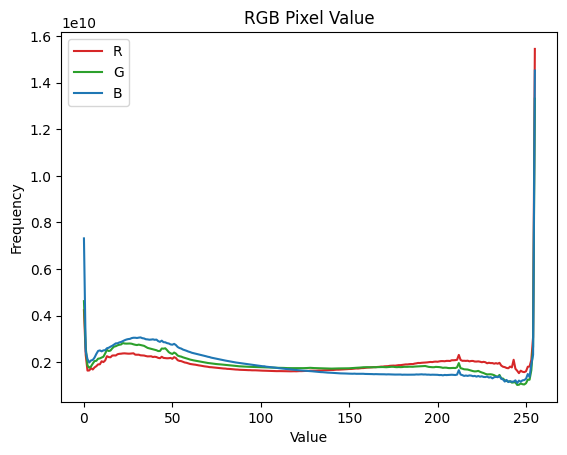

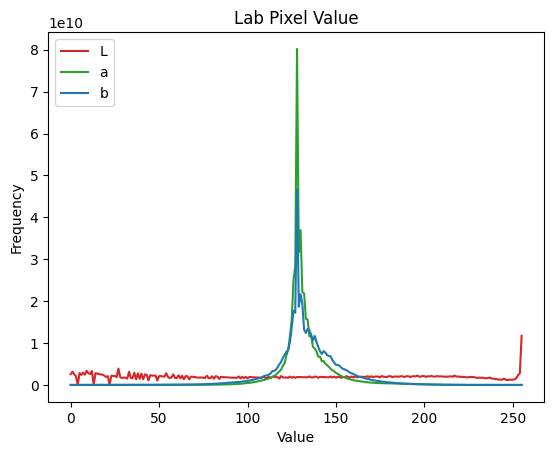

In [5]:
RGB_graph_colors = ['tab:red', 'tab:green', 'tab:blue']
Lab_graph_colors = ['tab:red', 'tab:green', 'tab:blue']

values = range(0, 256)

# plot RGB frequencies
for idx, channel in enumerate(RGB_channels):
    plt.plot(values, RGB_frequencies[idx], color=RGB_graph_colors[idx])
    plt.title('RGB Pixel Value')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.legend(RGB_channels, loc='upper left')
plt.show()

# plot Lab frequencies
for idx, channel in enumerate(Lab_channels):
    plt.plot(values, Lab_frequencies[idx], color=Lab_graph_colors[idx])
    plt.title('Lab Pixel Value')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.legend(Lab_channels, loc='upper left')
plt.show()

In [6]:
# remove [0, 0] entires from failed image reads
sizes = sizes[np.all(sizes != [0, 0], axis=1)]

size_df = pd.DataFrame(sizes, columns=['height', 'width'])

display(size_df.describe())

,height,width
count,1.211628e+06,1.211628e+06
mean,6.478348e+02,6.358189e+02
std,1.181346e+02,2.680423e+01
min,1.670000e+02,3.200000e+02
25%,6.400000e+02,6.400000e+02
50%,6.400000e+02,6.400000e+02
75%,7.750000e+02,6.400000e+02
max,1.138000e+03,6.400000e+02


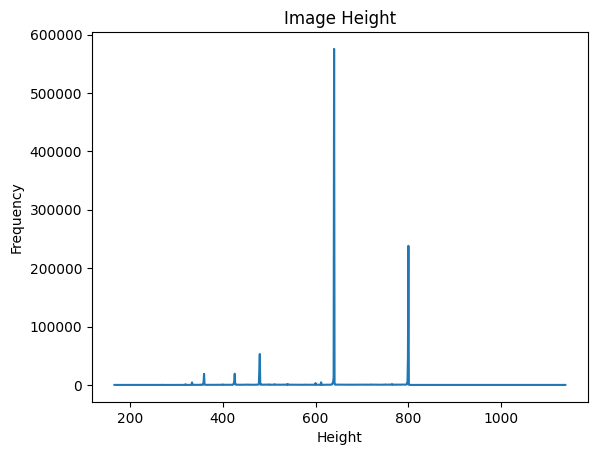

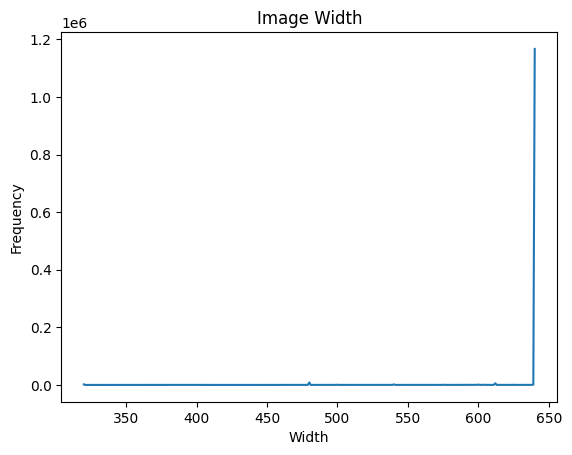

In [7]:
height_freq = np.bincount(sizes[:,0])
nonzero_height_freq = np.nonzero(height_freq)[0]
min_height_idx = nonzero_height_freq[0]
max_height_idx = nonzero_height_freq[-1]
height_freq_tr = height_freq[min_height_idx:max_height_idx + 1]
height = np.arange(min_height_idx, max_height_idx + 1)

width_freq = np.bincount(sizes[:,1])
nonzero_width_freq = np.nonzero(width_freq)[0]
min_width_idx = nonzero_width_freq[0]
max_width_idx = nonzero_width_freq[-1]
width_freq_tr = width_freq[min_width_idx:max_width_idx + 1]
width = np.arange(min_width_idx, max_width_idx + 1)

plt.plot(height, height_freq_tr)
plt.title('Image Height')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.show()

plt.plot(width, width_freq_tr)
plt.title('Image Width')
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.show()

In [8]:
input_dir = 'archive'
input_path = Path(input_dir)
num_images = sum(1 for _ in input_path.rglob('*') if _.is_file())

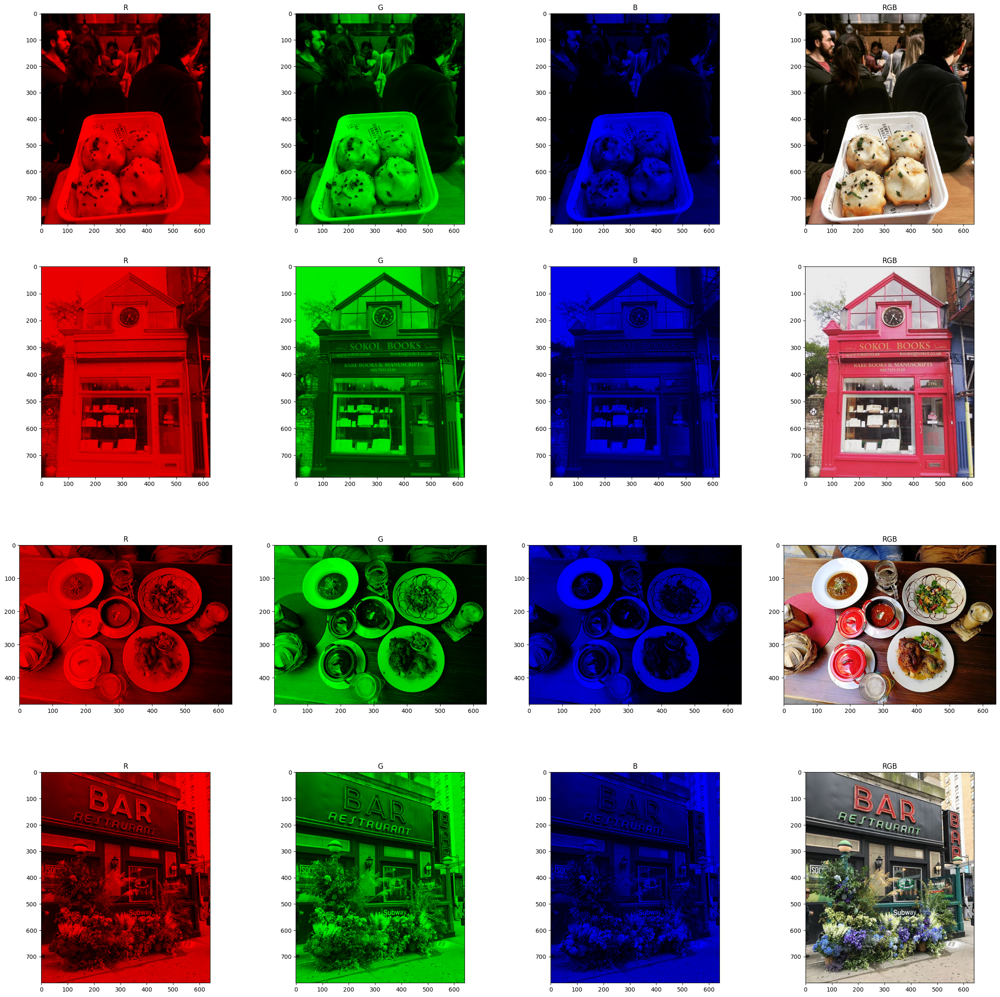

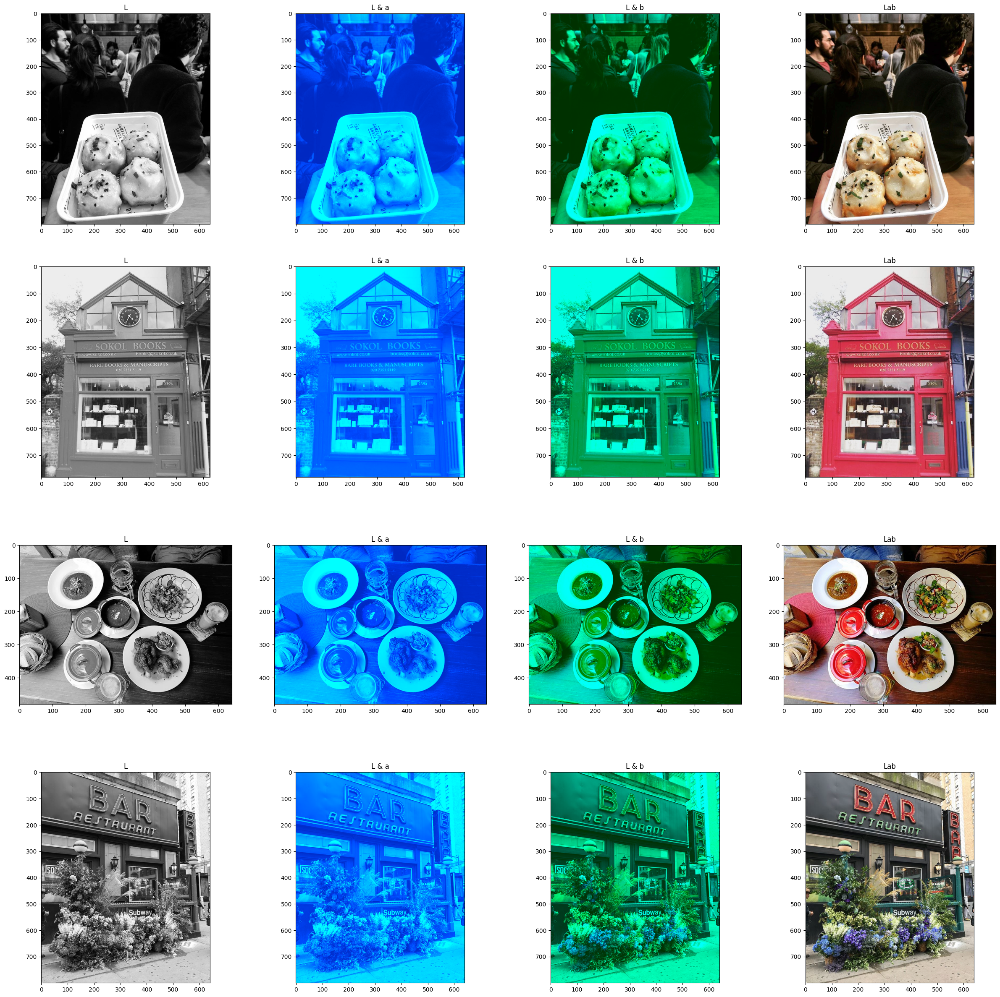

In [13]:
images_RGB = []
images_Lab = []

# get 4 "random" images
num_to_read = 4
num_read = 0
for image_file in input_path.rglob('*'):
    if random.random() > 0.1:
        continue
    if image_file.is_file():
        im_BGR = cv2.imread(str(image_file))
        if im_BGR is None:
            continue
        images_RGB.append(cv2.cvtColor(im_BGR, cv2.COLOR_BGR2RGB))
        images_Lab.append(cv2.cvtColor(im_BGR, cv2.COLOR_BGR2Lab))
        num_read += 1
        if num_read == num_to_read:
            break


def plot_images(images, color_space, channels, titles, figsize=(30, 30)):
    plt.figure(figsize=figsize)
    for i in range(0, len(images) * 4, 4):
        idx = i // 4
        for j, (channel, title) in enumerate(zip(channels, titles)):
            plt.subplot(len(images), 4, i + j + 1)
            img = np.zeros_like(images[idx])
            if color_space == 'RGB':
                if channel == 'RGB':
                    img = images[idx]
                else:
                    img[:, :, j] = images[idx][:, :, j]
            elif color_space == 'Lab':
                if channel == 'Lab':
                    img = cv2.cvtColor(images[idx], cv2.COLOR_Lab2RGB)
                elif channel == 'L':
                    img = np.stack([images[idx][:, :, 0]] * 3, axis=-1)
                elif channel == 'a':
                    img[:, :, (0, 1)] = images[idx][:, :, (0, 1)]
                    img = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
                elif channel == 'b':
                    img[:, :, (0, 2)] = images[idx][:, :, (0, 2)]
                    img = cv2.cvtColor(img, cv2.COLOR_Lab2RGB)
            plt.title(title)
            plt.imshow(img.astype('uint8'))

# define the parameters for RGB and Lab images
channels_RGB = ['R', 'G', 'B', 'RGB']
titles_RGB = ['R', 'G', 'B', 'RGB']
channels_Lab = ['L', 'a', 'b', 'Lab']
titles_Lab = ['L', 'L & a', 'L & b', 'Lab']

# plot RGB images
plot_images(images_RGB, 'RGB', channels_RGB, titles_RGB)

# plot Lab images
plot_images(images_Lab, 'Lab', channels_Lab, titles_Lab)